# YOLO Human Detection — Testing on Kaggle CCTV Dataset

This notebook uses a **pretrained YOLOv8** model to detect humans on the [Human Detection Dataset](https://www.kaggle.com/datasets/constantinwerner/human-detection-dataset).

**About the dataset:**
- **Folder `0/`**: images with **no humans** (362 images)
- **Folder `1/`**: images **with humans** (559 images)
- No bounding-box annotations — only image-level labels (human present / not present)

**Approach:**
1. Use YOLOv8 pretrained on COCO (which includes "person" class) to run detection
2. If YOLO detects ≥1 person → predict **"human present"**
3. Compare YOLO predictions against the ground-truth folder labels
4. Compute accuracy, precision, recall, F1, and confusion matrix

## 1. Install Dependencies

In [1]:
!pip install ultralytics opencv-python-headless kagglehub scikit-learn --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 29.3 MB/s eta 0:00:00


## 2. Download Dataset

Uses `kagglehub` to download the dataset — no API key file needed. It will prompt you to log in via browser if not already authenticated.

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("constantinwerner/human-detection-dataset")

print("Path to dataset files:", path)

100%|██████████| 260M/260M [00:02<00:00, 123MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/constantinwerner/human-detection-dataset/versions/5


## 3. Explore Dataset Structure

In [9]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

DATASET_DIR = path  # from kagglehub

# Auto-detect nested folder structure
# The dataset may be: path/0/, path/1/  OR  path/human detection dataset/0/, path/human detection dataset/1/
if not (os.path.isdir(os.path.join(DATASET_DIR, '0')) and os.path.isdir(os.path.join(DATASET_DIR, '1'))):
    # Look one level deeper for folders named '0' and '1'
    for sub in os.listdir(DATASET_DIR):
        sub_path = os.path.join(DATASET_DIR, sub)
        if os.path.isdir(sub_path) and os.path.isdir(os.path.join(sub_path, '0')) and os.path.isdir(os.path.join(sub_path, '1')):
            DATASET_DIR = sub_path
            print(f"Found nested dataset folder: {DATASET_DIR}")
            break

# List top-level contents
print("\nDataset structure:")
for item in sorted(os.listdir(DATASET_DIR)):
    full = os.path.join(DATASET_DIR, item)
    if os.path.isdir(full):
        files_in = os.listdir(full)
        print(f"  Folder '{item}/': {len(files_in)} images")
    else:
        print(f"  File: {item}")

# Collect all images with their ground-truth label
images = []
for label in ['0', '1']:
    folder = os.path.join(DATASET_DIR, label)
    if not os.path.isdir(folder):
        continue
    for fname in sorted(os.listdir(folder)):
        fpath = os.path.join(folder, fname)
        if os.path.isfile(fpath):
            images.append({'path': fpath, 'label': int(label), 'name': fname})

print(f"\nTotal images: {len(images)}")
print(f"  No human (label=0): {sum(1 for i in images if i['label']==0)}")
print(f"  Human    (label=1): {sum(1 for i in images if i['label']==1)}")

Found nested dataset folder: /root/.cache/kagglehub/datasets/constantinwerner/human-detection-dataset/versions/5/human detection dataset

Dataset structure:
  Folder '0/': 362 images
  Folder '1/': 559 images

Total images: 921
  No human (label=0): 362
  Human    (label=1): 559


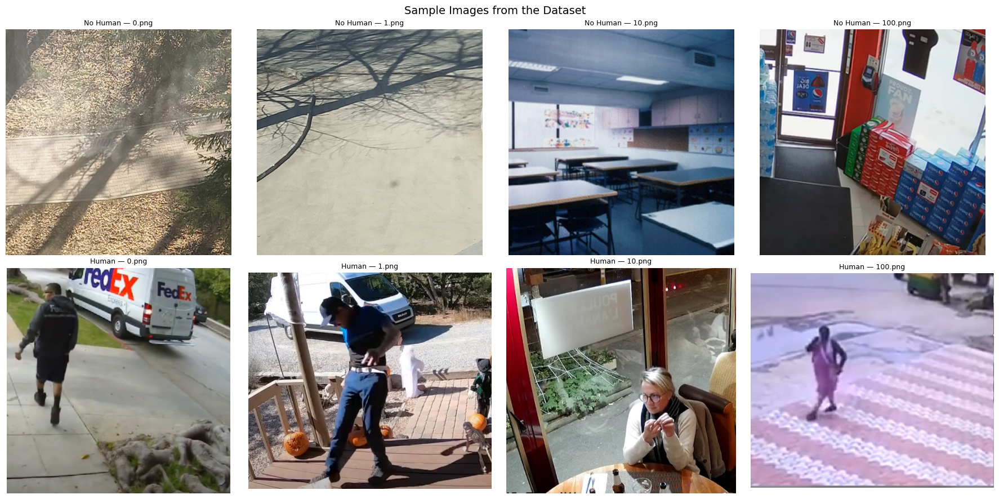

In [10]:
# Show sample images from each class
fig, axes = plt.subplots(2, 4, figsize=(18, 9))

no_human_imgs = [i for i in images if i['label'] == 0]
human_imgs    = [i for i in images if i['label'] == 1]

for j, img_info in enumerate(no_human_imgs[:4]):
    img = cv2.imread(img_info['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[0, j].imshow(img)
    axes[0, j].set_title(f"No Human — {img_info['name']}", fontsize=9)
    axes[0, j].axis('off')

for j, img_info in enumerate(human_imgs[:4]):
    img = cv2.imread(img_info['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[1, j].imshow(img)
    axes[1, j].set_title(f"Human — {img_info['name']}", fontsize=9)
    axes[1, j].axis('off')

axes[0, 0].set_ylabel('Label 0\n(No Human)', fontsize=12, rotation=0, labelpad=80)
axes[1, 0].set_ylabel('Label 1\n(Human)', fontsize=12, rotation=0, labelpad=80)
plt.suptitle('Sample Images from the Dataset', fontsize=14)
plt.tight_layout()
plt.show()

## 4. Load Pretrained YOLOv8 Model

We use YOLOv8 pretrained on **COCO**, which includes the "person" class (class 0 in COCO). No fine-tuning needed — we just run inference.

In [11]:
from ultralytics import YOLO

# Load pretrained YOLOv8 (try different sizes: 'n', 's', 'm', 'l', 'x')
model = YOLO('yolov8n.pt')  # nano — fastest
print("Model loaded:", model.model_name if hasattr(model, 'model_name') else 'yolov8n')
print(f"COCO 'person' class index: 0")
print(f"Total COCO classes: {len(model.names)}")
print(f"Class 0: '{model.names[0]}'")

Model loaded: yolov8n.pt
COCO 'person' class index: 0
Total COCO classes: 80
Class 0: 'person'


In [12]:
## 5. Run YOLO Inference on All Images

##For each image, we run YOLO and check if any "person" (class 0) is detected with confidence ≥ threshold.

In [13]:
from tqdm import tqdm

CONF_THRESHOLD = 0.25  # minimum confidence to count a detection
PERSON_CLASS_ID = 0    # COCO class id for 'person'

results_list = []

for img_info in tqdm(images, desc="Running YOLO inference"):
    # Run inference (only detect 'person' class)
    preds = model.predict(
        img_info['path'],
        imgsz=640,
        conf=CONF_THRESHOLD,
        classes=[PERSON_CLASS_ID],  # only detect people
        verbose=False
    )

    result = preds[0]
    person_boxes = result.boxes
    n_persons = len(person_boxes)
    max_conf = float(person_boxes.conf.max()) if n_persons > 0 else 0.0

    results_list.append({
        'path': img_info['path'],
        'name': img_info['name'],
        'gt_label': img_info['label'],           # 0=no human, 1=human
        'yolo_pred': 1 if n_persons > 0 else 0,  # YOLO prediction
        'num_detections': n_persons,
        'max_confidence': max_conf,
    })

print(f"\nInference complete on {len(results_list)} images.")

Running YOLO inference: 100%|██████████| 921/921 [00:20<00:00, 45.80it/s]


Inference complete on 921 images.


## 6. Evaluation Metrics

In [14]:
import pandas as pd
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, confusion_matrix, classification_report)

df = pd.DataFrame(results_list)

gt = df['gt_label'].values
pred = df['yolo_pred'].values

accuracy  = accuracy_score(gt, pred)
precision = precision_score(gt, pred)
recall    = recall_score(gt, pred)
f1        = f1_score(gt, pred)

print("=" * 55)
print(f"  YOLOv8 Human Detection — Evaluation Results")
print(f"  Confidence threshold: {CONF_THRESHOLD}")
print("=" * 55)
print(f"  Accuracy:   {accuracy:.4f}  ({int(accuracy * len(gt))}/{len(gt)})")
print(f"  Precision:  {precision:.4f}")
print(f"  Recall:     {recall:.4f}")
print(f"  F1 Score:   {f1:.4f}")
print("=" * 55)
print()
print("Classification Report:")
print(classification_report(gt, pred, target_names=['No Human', 'Human']))

  YOLOv8 Human Detection — Evaluation Results
  Confidence threshold: 0.25
  Accuracy:   0.9262  (853/921)
  Precision:  0.9488
  Recall:     0.9284
  F1 Score:   0.9385

Classification Report:
              precision    recall  f1-score   support

    No Human       0.89      0.92      0.91       362
       Human       0.95      0.93      0.94       559

    accuracy                           0.93       921
   macro avg       0.92      0.93      0.92       921
weighted avg       0.93      0.93      0.93       921



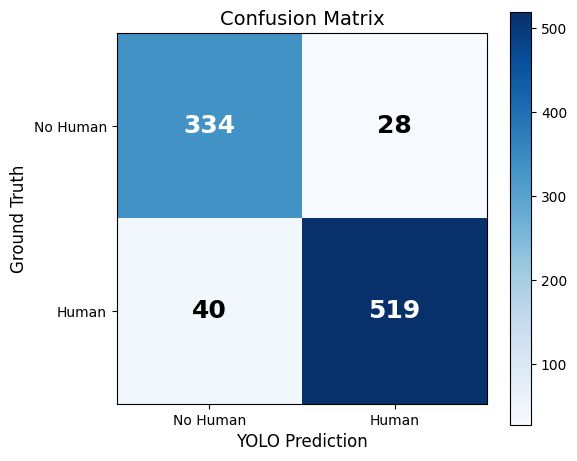

True Negatives:  334  (correctly detected no human)
False Positives: 28  (wrongly detected human)
False Negatives: 40  (missed a human)
True Positives:  519  (correctly detected human)


In [15]:
# Confusion Matrix
cm = confusion_matrix(gt, pred)

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(cm, cmap='Blues')
ax.set_xticks([0, 1]); ax.set_yticks([0, 1])
ax.set_xticklabels(['No Human', 'Human'])
ax.set_yticklabels(['No Human', 'Human'])
ax.set_xlabel('YOLO Prediction', fontsize=12)
ax.set_ylabel('Ground Truth', fontsize=12)
ax.set_title('Confusion Matrix', fontsize=14)

# Annotate cells
for i in range(2):
    for j in range(2):
        color = 'white' if cm[i, j] > cm.max() / 2 else 'black'
        ax.text(j, i, str(cm[i, j]), ha='center', va='center',
                fontsize=18, fontweight='bold', color=color)

plt.colorbar(im)
plt.tight_layout()
plt.show()

print(f"True Negatives:  {cm[0,0]}  (correctly detected no human)")
print(f"False Positives: {cm[0,1]}  (wrongly detected human)")
print(f"False Negatives: {cm[1,0]}  (missed a human)")
print(f"True Positives:  {cm[1,1]}  (correctly detected human)")

## 7. Confidence & Detection Distribution

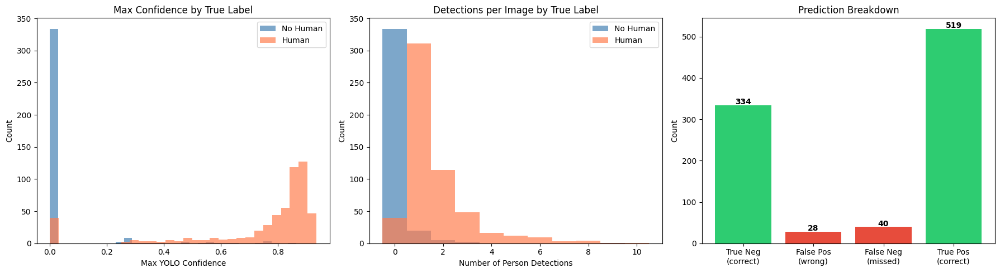

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1) Max confidence distribution by true label
for label, color, name in [(0, 'steelblue', 'No Human'), (1, 'coral', 'Human')]:
    subset = df[df['gt_label'] == label]['max_confidence']
    axes[0].hist(subset, bins=30, alpha=0.7, color=color, label=name)
axes[0].set_xlabel('Max YOLO Confidence')
axes[0].set_ylabel('Count')
axes[0].set_title('Max Confidence by True Label')
axes[0].legend()

# 2) Number of detections per image
for label, color, name in [(0, 'steelblue', 'No Human'), (1, 'coral', 'Human')]:
    subset = df[df['gt_label'] == label]['num_detections']
    axes[1].hist(subset, bins=range(0, df['num_detections'].max() + 2),
                 alpha=0.7, color=color, label=name, align='left')
axes[1].set_xlabel('Number of Person Detections')
axes[1].set_ylabel('Count')
axes[1].set_title('Detections per Image by True Label')
axes[1].legend()

# 3) Detection counts summary
categories = ['True Neg\n(correct)', 'False Pos\n(wrong)', 'False Neg\n(missed)', 'True Pos\n(correct)']
values = [cm[0,0], cm[0,1], cm[1,0], cm[1,1]]
colors = ['#2ecc71', '#e74c3c', '#e74c3c', '#2ecc71']
axes[2].bar(categories, values, color=colors)
axes[2].set_ylabel('Count')
axes[2].set_title('Prediction Breakdown')
for i, v in enumerate(values):
    axes[2].text(i, v + 2, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

## 8. Visualize Correct Predictions

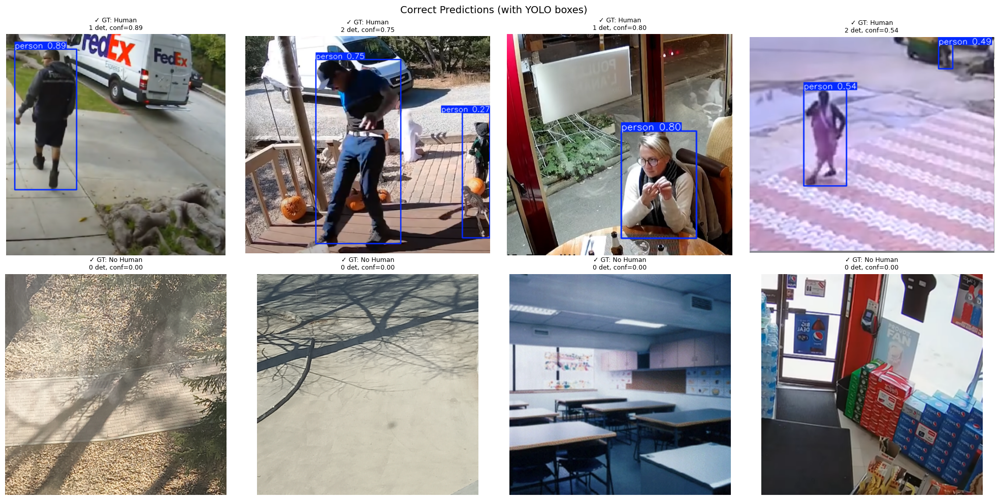

In [17]:
# Show correct predictions with YOLO bounding boxes
correct = df[df['gt_label'] == df['yolo_pred']]
correct_humans = correct[correct['gt_label'] == 1].head(4)
correct_no_humans = correct[correct['gt_label'] == 0].head(4)
samples = pd.concat([correct_humans, correct_no_humans])

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for idx, (_, row) in enumerate(samples.iterrows()):
    r = idx // 4
    c = idx % 4
    preds = model.predict(row['path'], imgsz=640, conf=CONF_THRESHOLD,
                          classes=[PERSON_CLASS_ID], verbose=False)
    annotated = preds[0].plot()
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    axes[r, c].imshow(annotated)
    label_str = "Human" if row['gt_label'] == 1 else "No Human"
    axes[r, c].set_title(f"✓ GT: {label_str}\n{row['num_detections']} det, conf={row['max_confidence']:.2f}", fontsize=9)
    axes[r, c].axis('off')

axes[0, 0].set_ylabel('True Positives', fontsize=12)
axes[1, 0].set_ylabel('True Negatives', fontsize=12)
plt.suptitle('Correct Predictions (with YOLO boxes)', fontsize=14)
plt.tight_layout()
plt.show()

## 9. Visualize Errors (Misclassifications)

Total errors: 68 / 921
  False Positives: 28 (YOLO sees human, but none in GT)
  False Negatives: 40 (YOLO misses human in GT)


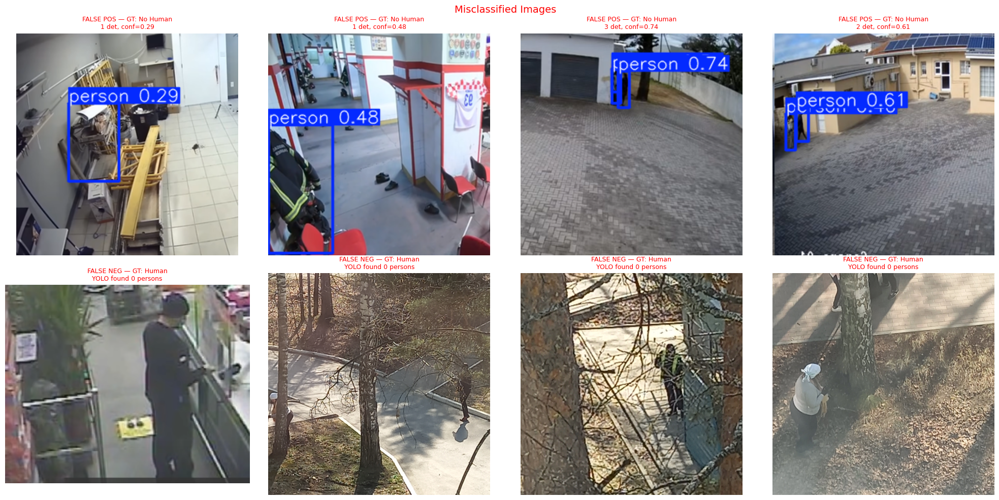

In [18]:
# Show misclassifications
errors = df[df['gt_label'] != df['yolo_pred']]
false_pos = errors[errors['yolo_pred'] == 1].head(4)  # predicted human but GT=no human
false_neg = errors[errors['yolo_pred'] == 0].head(4)  # missed human

print(f"Total errors: {len(errors)} / {len(df)}")
print(f"  False Positives: {len(errors[errors['yolo_pred']==1])} (YOLO sees human, but none in GT)")
print(f"  False Negatives: {len(errors[errors['yolo_pred']==0])} (YOLO misses human in GT)")

samples_err = pd.concat([false_pos, false_neg])

if len(samples_err) > 0:
    n_rows = min(2, len(samples_err) // 4 + 1) if len(false_pos) > 0 and len(false_neg) > 0 else 1
    n_cols = min(4, max(len(false_pos), len(false_neg)))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, -1) if n_cols > 1 else np.array([[axes]])

    for idx, (_, row) in enumerate(samples_err.iterrows()):
        r = 0 if idx < len(false_pos) else 1
        c = idx if idx < len(false_pos) else idx - len(false_pos)
        if r >= n_rows or c >= n_cols:
            continue

        preds = model.predict(row['path'], imgsz=640, conf=CONF_THRESHOLD,
                              classes=[PERSON_CLASS_ID], verbose=False)
        annotated = preds[0].plot()
        annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        axes[r, c].imshow(annotated)

        if row['yolo_pred'] == 1 and row['gt_label'] == 0:
            axes[r, c].set_title(f"FALSE POS — GT: No Human\n{row['num_detections']} det, conf={row['max_confidence']:.2f}", fontsize=9, color='red')
        else:
            axes[r, c].set_title(f"FALSE NEG — GT: Human\nYOLO found 0 persons", fontsize=9, color='red')
        axes[r, c].axis('off')

    plt.suptitle('Misclassified Images', fontsize=14, color='red')
    plt.tight_layout()
    plt.show()
else:
    print("No errors — perfect detection!")

## 10. Differential Privacy — Impact on Predictions

**Differential Privacy (DP)** adds calibrated noise to outputs so that individual data points cannot be reverse-engineered. Here we apply DP in two ways:

1. **Laplace mechanism on confidence scores** — add Laplace noise (scale = sensitivity / ε) to each YOLO confidence score before thresholding. A lower ε means more privacy (more noise) but worse utility.
2. **Randomized Response on binary predictions** — flip the "human / no human" prediction with a probability controlled by ε.

We sweep ε from very private (ε = 0.1) to nearly non-private (ε = 10) and compare how much accuracy, precision, recall, and F1 degrade versus the baseline (no DP).

In [19]:
## --- 11a. Laplace Mechanism on Confidence Scores ---

np.random.seed(42)

# Sensitivity of the confidence score (bounded in [0, 1])
sensitivity = 1.0

# Epsilon values to test (smaller = more private = more noise)
epsilons = [0.1, 0.25, 0.5, 1.0, 2.0, 5.0, 10.0]

# Baseline (no DP)
baseline_preds = (df['max_confidence'] >= CONF_THRESHOLD).astype(int).values
baseline_acc = accuracy_score(gt, baseline_preds)
baseline_prec = precision_score(gt, baseline_preds, zero_division=0)
baseline_rec = recall_score(gt, baseline_preds, zero_division=0)
baseline_f1  = f1_score(gt, baseline_preds)

dp_laplace_results = []

for eps in epsilons:
    scale = sensitivity / eps
    # Add Laplace noise to each confidence score
    noisy_confs = df['max_confidence'].values + np.random.laplace(0, scale, size=len(df))
    # Clip to valid range
    noisy_confs = np.clip(noisy_confs, 0, 1)
    # Threshold to get binary prediction
    dp_preds = (noisy_confs >= CONF_THRESHOLD).astype(int)

    dp_laplace_results.append({
        'epsilon': eps,
        'accuracy': accuracy_score(gt, dp_preds),
        'precision': precision_score(gt, dp_preds, zero_division=0),
        'recall': recall_score(gt, dp_preds, zero_division=0),
        'f1': f1_score(gt, dp_preds, zero_division=0),
        'acc_drop': baseline_acc - accuracy_score(gt, dp_preds),
        'f1_drop': baseline_f1 - f1_score(gt, dp_preds, zero_division=0),
    })

df_dp_lap = pd.DataFrame(dp_laplace_results)

print("Laplace Mechanism on Confidence Scores")
print("=" * 80)
print(f"  Baseline (no DP): Acc={baseline_acc:.4f}, Prec={baseline_prec:.4f}, "
      f"Rec={baseline_rec:.4f}, F1={baseline_f1:.4f}")
print("-" * 80)
for _, row in df_dp_lap.iterrows():
    print(f"  eps={row['epsilon']:<6.2f}  Acc={row['accuracy']:.4f}  Prec={row['precision']:.4f}  "
          f"Rec={row['recall']:.4f}  F1={row['f1']:.4f}  "
          f"(Acc drop={row['acc_drop']:+.4f}, F1 drop={row['f1_drop']:+.4f})")
print("=" * 80)

Laplace Mechanism on Confidence Scores
  Baseline (no DP): Acc=0.9262, Prec=0.9488, Rec=0.9284, F1=0.9385
--------------------------------------------------------------------------------
  eps=0.10    Acc=0.5060  Prec=0.6126  Rec=0.5063  F1=0.5544  (Acc drop=+0.4202, F1 drop=+0.3842)
  eps=0.25    Acc=0.5331  Prec=0.6298  Rec=0.5599  F1=0.5928  (Acc drop=+0.3931, F1 drop=+0.3457)
  eps=0.50    Acc=0.5700  Prec=0.6607  Rec=0.5993  F1=0.6285  (Acc drop=+0.3561, F1 drop=+0.3100)
  eps=1.00    Acc=0.6287  Prec=0.7043  Rec=0.6691  F1=0.6862  (Acc drop=+0.2975, F1 drop=+0.2523)
  eps=2.00    Acc=0.7372  Prec=0.7887  Rec=0.7746  F1=0.7816  (Acc drop=+0.1889, F1 drop=+0.1569)
  eps=5.00    Acc=0.8610  Prec=0.8709  Rec=0.9052  F1=0.8877  (Acc drop=+0.0651, F1 drop=+0.0508)
  eps=10.00   Acc=0.9110  Prec=0.9313  Rec=0.9213  F1=0.9263  (Acc drop=+0.0152, F1 drop=+0.0123)


In [20]:
## --- 11b. Randomized Response on Binary Predictions ---

def randomized_response(true_pred, epsilon):
    """Flip each binary prediction with probability 1/(1+e^epsilon)."""
    p_keep = np.exp(epsilon) / (1 + np.exp(epsilon))  # probability of keeping true answer
    flips = np.random.random(len(true_pred)) > p_keep
    noisy = true_pred.copy()
    noisy[flips] = 1 - noisy[flips]
    return noisy

np.random.seed(42)
dp_rr_results = []

for eps in epsilons:
    rr_preds = randomized_response(baseline_preds.copy(), eps)
    dp_rr_results.append({
        'epsilon': eps,
        'accuracy': accuracy_score(gt, rr_preds),
        'precision': precision_score(gt, rr_preds, zero_division=0),
        'recall': recall_score(gt, rr_preds, zero_division=0),
        'f1': f1_score(gt, rr_preds, zero_division=0),
        'acc_drop': baseline_acc - accuracy_score(gt, rr_preds),
        'f1_drop': baseline_f1 - f1_score(gt, rr_preds, zero_division=0),
        'flip_rate': 1.0 / (1 + np.exp(eps)),
    })

df_dp_rr = pd.DataFrame(dp_rr_results)

print("Randomized Response on Binary Predictions")
print("=" * 85)
print(f"  Baseline (no DP): Acc={baseline_acc:.4f}, F1={baseline_f1:.4f}")
print("-" * 85)
for _, row in df_dp_rr.iterrows():
    print(f"  eps={row['epsilon']:<6.2f}  Acc={row['accuracy']:.4f}  F1={row['f1']:.4f}  "
          f"flip_rate={row['flip_rate']:.3f}  "
          f"(Acc drop={row['acc_drop']:+.4f}, F1 drop={row['f1_drop']:+.4f})")
print("=" * 85)

Randomized Response on Binary Predictions
  Baseline (no DP): Acc=0.9262, F1=0.9385
-------------------------------------------------------------------------------------
  eps=0.10    Acc=0.5407  F1=0.5968  flip_rate=0.475  (Acc drop=+0.3855, F1 drop=+0.3418)
  eps=0.25    Acc=0.5472  F1=0.6025  flip_rate=0.438  (Acc drop=+0.3789, F1 drop=+0.3360)
  eps=0.50    Acc=0.6026  F1=0.6514  flip_rate=0.378  (Acc drop=+0.3236, F1 drop=+0.2871)
  eps=1.00    Acc=0.6906  F1=0.7324  flip_rate=0.269  (Acc drop=+0.2356, F1 drop=+0.2061)
  eps=2.00    Acc=0.8274  F1=0.8548  flip_rate=0.119  (Acc drop=+0.0988, F1 drop=+0.0837)
  eps=5.00    Acc=0.9218  F1=0.9349  flip_rate=0.007  (Acc drop=+0.0043, F1 drop=+0.0036)
  eps=10.00   Acc=0.9262  F1=0.9385  flip_rate=0.000  (Acc drop=+0.0000, F1 drop=+0.0000)


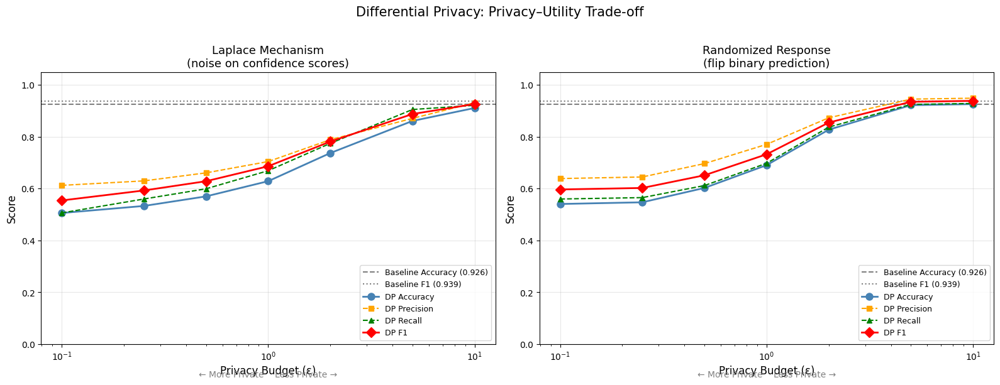

In [21]:
## --- 11c. Visualize DP Impact ---

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# --- Left: Laplace Mechanism ---
ax = axes[0]
ax.axhline(y=baseline_acc, color='gray', linestyle='--', label=f'Baseline Accuracy ({baseline_acc:.3f})')
ax.axhline(y=baseline_f1, color='gray', linestyle=':', label=f'Baseline F1 ({baseline_f1:.3f})')
ax.plot(df_dp_lap['epsilon'], df_dp_lap['accuracy'], 'o-', color='steelblue', linewidth=2, markersize=8, label='DP Accuracy')
ax.plot(df_dp_lap['epsilon'], df_dp_lap['precision'], 's--', color='orange', linewidth=1.5, label='DP Precision')
ax.plot(df_dp_lap['epsilon'], df_dp_lap['recall'], '^--', color='green', linewidth=1.5, label='DP Recall')
ax.plot(df_dp_lap['epsilon'], df_dp_lap['f1'], 'D-', color='red', linewidth=2, markersize=8, label='DP F1')
ax.set_xlabel('Privacy Budget (ε)', fontsize=12)
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Laplace Mechanism\n(noise on confidence scores)', fontsize=13)
ax.set_xscale('log')
ax.set_ylim(0, 1.05)
ax.legend(fontsize=9, loc='lower right')
ax.grid(True, alpha=0.3)
ax.annotate('← More Private    Less Private →', xy=(0.5, -0.12),
            xycoords='axes fraction', ha='center', fontsize=10, color='gray')

# --- Right: Randomized Response ---
ax = axes[1]
ax.axhline(y=baseline_acc, color='gray', linestyle='--', label=f'Baseline Accuracy ({baseline_acc:.3f})')
ax.axhline(y=baseline_f1, color='gray', linestyle=':', label=f'Baseline F1 ({baseline_f1:.3f})')
ax.plot(df_dp_rr['epsilon'], df_dp_rr['accuracy'], 'o-', color='steelblue', linewidth=2, markersize=8, label='DP Accuracy')
ax.plot(df_dp_rr['epsilon'], df_dp_rr['precision'], 's--', color='orange', linewidth=1.5, label='DP Precision')
ax.plot(df_dp_rr['epsilon'], df_dp_rr['recall'], '^--', color='green', linewidth=1.5, label='DP Recall')
ax.plot(df_dp_rr['epsilon'], df_dp_rr['f1'], 'D-', color='red', linewidth=2, markersize=8, label='DP F1')
ax.set_xlabel('Privacy Budget (ε)', fontsize=12)
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Randomized Response\n(flip binary prediction)', fontsize=13)
ax.set_xscale('log')
ax.set_ylim(0, 1.05)
ax.legend(fontsize=9, loc='lower right')
ax.grid(True, alpha=0.3)
ax.annotate('← More Private    Less Private →', xy=(0.5, -0.12),
            xycoords='axes fraction', ha='center', fontsize=10, color='gray')

plt.suptitle('Differential Privacy: Privacy–Utility Trade-off', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

With ε=0.5 (Laplace), 403/921 predictions were flipped by DP noise.



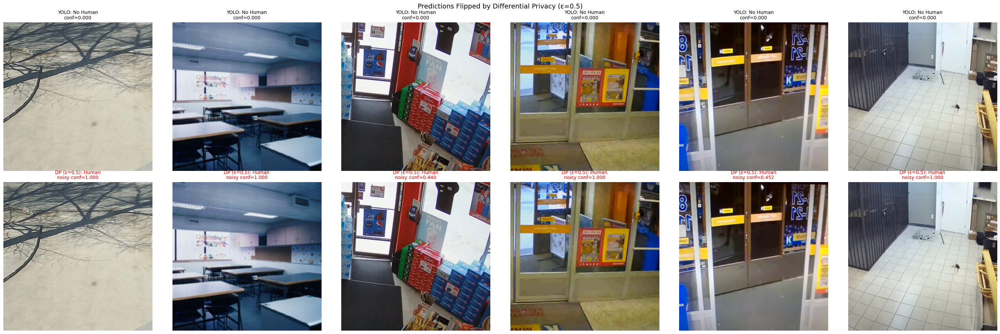

In [22]:
## --- 11d. Side-by-Side: Baseline vs Strong DP (ε=0.5) ---

np.random.seed(42)
eps_demo = 0.5
scale_demo = sensitivity / eps_demo

# Pick some images where DP flips the prediction
noisy_confs_demo = df['max_confidence'].values + np.random.laplace(0, scale_demo, size=len(df))
noisy_confs_demo = np.clip(noisy_confs_demo, 0, 1)
dp_preds_demo = (noisy_confs_demo >= CONF_THRESHOLD).astype(int)

df['dp_pred_demo'] = dp_preds_demo
df['dp_conf_demo'] = noisy_confs_demo
flipped = df[df['yolo_pred'] != df['dp_pred_demo']]

print(f"With ε={eps_demo} (Laplace), {len(flipped)}/{len(df)} predictions were flipped by DP noise.\n")

# Show some flipped examples
show_flipped = flipped.head(6)
if len(show_flipped) > 0:
    n = len(show_flipped)
    fig, axes = plt.subplots(2, n, figsize=(5 * n, 10))
    if n == 1:
        axes = axes.reshape(2, 1)

    for j, (_, row) in enumerate(show_flipped.iterrows()):
        img = cv2.imread(row['path'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Top row: original YOLO prediction
        axes[0, j].imshow(img)
        orig = "Human" if row['yolo_pred'] == 1 else "No Human"
        axes[0, j].set_title(f"YOLO: {orig}\nconf={row['max_confidence']:.3f}", fontsize=10)
        axes[0, j].axis('off')

        # Bottom row: after DP noise
        axes[1, j].imshow(img)
        dp = "Human" if row['dp_pred_demo'] == 1 else "No Human"
        axes[1, j].set_title(f"DP (ε={eps_demo}): {dp}\nnoisy conf={row['dp_conf_demo']:.3f}",
                             fontsize=10, color='red')
        axes[1, j].axis('off')

    axes[0, 0].set_ylabel('Original\nYOLO', fontsize=13, rotation=0, labelpad=70)
    axes[1, 0].set_ylabel(f'With DP\n(ε={eps_demo})', fontsize=13, rotation=0, labelpad=70)
    plt.suptitle(f'Predictions Flipped by Differential Privacy (ε={eps_demo})', fontsize=14)
    plt.tight_layout()
    plt.show()
else:
    print("No predictions were flipped at this epsilon.")